In [1]:
import altair as alt
import pandas as pd
import glob, os
import spacy
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.manifold import MDS
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
from sklearn.feature_selection import chi2
import gensim
from gensim.corpora import Dictionary
from gensim.similarities import MatrixSimilarity
from gensim.models import ldamodel, doc2vec, LsiModel
import nltk
import string
from nltk.corpus import stopwords
from nltk.util import ngrams
alt.renderers.enable('notebook')
alt.data_transformers.enable('default', max_rows=None)

DataTransformerRegistry.enable('default')

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
htrc_df = pd.read_csv('Arab_Observer_Distributions_Untokenized.csv')

In [10]:
len(htrc_df)

11183

In [9]:
nltk_df = pd.read_csv('Arab_Observer_Tokenized_Distributions.csv')
len(nltk_df.index)

11183

In [47]:
### All words distributions
# alt.Chart(nltk_df).mark_area().encode(
#     x=alt.X('page:O'),
#     y=alt.Y('word_count:Q', title=None),
#     color=alt.Color('htrc_vol:N', scale=alt.Scale(scheme='category20')),
#     row=alt.Row('htrc_vol:N')
# ).properties(height=50, width=800)

In [20]:
## All words distributions
cairo_df = nltk_df
# cairo_df = cairo_df.loc[(cairo_df['lowercase'].str.contains('congo') == True)]
data = cairo_df
data['year'] = data.htrc_vol.str.split('_').str[2]
data['months'] = data.htrc_vol.str.split('_').str[3]
data['first_month'] = data.months.str.split('-').str[0]
data['second_month'] = data.months.str.split('-').str[1]
data['second_month'].fillna('dec', inplace=True)
data.first_month = data.first_month.str.capitalize()
data.second_month = data.second_month.str.capitalize()
data['first_month_index'] = pd.to_datetime(data['first_month'], format='%b', errors='coerce').dt.month
data['second_month_index'] = pd.to_datetime(data['second_month'], format='%b', errors='coerce').dt.month
data = data.sort_values(by=['year', 'first_month_index'])
data.htrc_vol.str.split('_')
data['date'] = pd.to_datetime(data['year'].apply(str)+'-'+data['first_month_index'].apply(str), format='%Y-%m')
data.date =data.date.dt.strftime('%Y-%m')


# alt.Chart(data).mark_area().encode(
#     x=alt.X('page:O'),
#     y=alt.Y('word_count:Q', title=None),
#     color=alt.Color('date', scale=alt.Scale(scheme='category20')),
#     row=alt.Row('date')
# ).properties(height=50, width=400, title="Occurences of India in issues of Arab Observer")


In [26]:
data.tokenized

3104                                              604,972 
3105                                  art c1e e n veritas 
3106                                    .^^■^ e polaris r 
3107                                                   NaN
3108     `` `` '' at*/ armer ast cairo chose chose hour...
3109     100/ 1050 112/6 1250 350 37.50 450 5000 5000 5...
3110     `` `` `` '' '' -•'we affiliated book chose cho...
3111     arab arab araba arabe arabische beginning che ...
3112     24 50 5£© ouch rication \sr affiliated announc...
3113     1854 1963 2 2.00 38 568 5738 77393 79054/5 8.3...
3114     4 51957 70981 74062 9-11 affiliated agents ale...
3115     's 36 57139 57432 57534 a.r abroad achieved ad...
3116     l `` `` *r 1165 133 16 1963 21 31 39 45 4\ 50 ...
3117     'destruction 's 's 's 's 's 's *l 1960 1961 19...
3118     's 's 180,000 1960 1963 abdel accompanied accu...
3119     's agency analysts authoritative behind compre...
3120     's 's 's 's 's .. » 15,000 183 186s 1960 1964 .

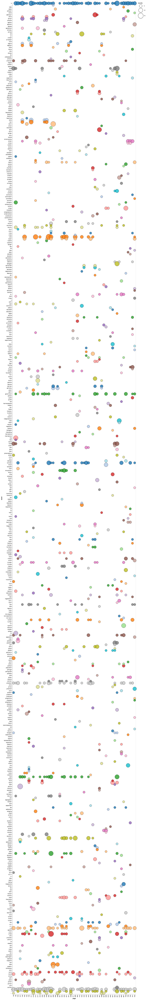

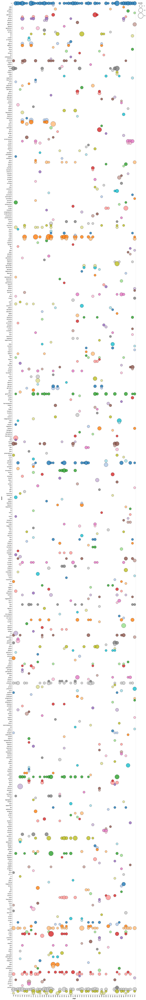

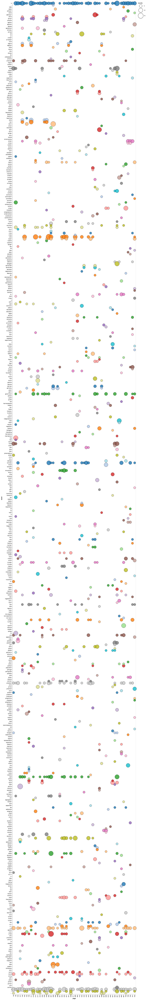

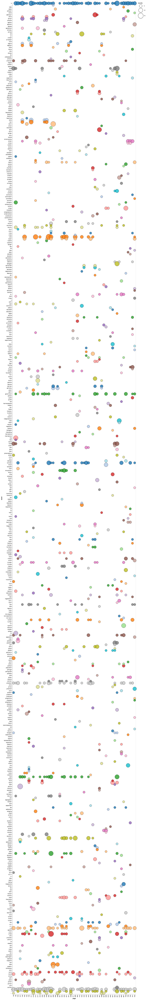

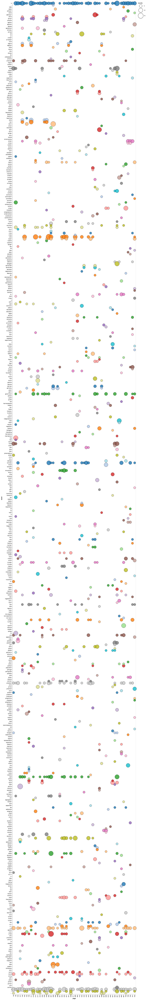

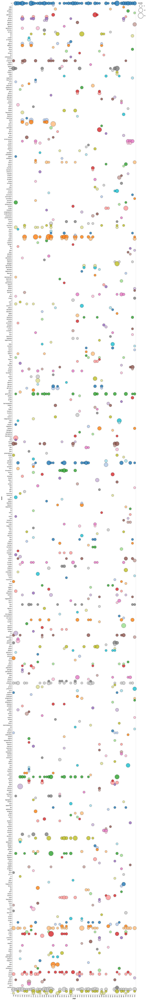

In [55]:
data = pd.read_csv('bandung_freq.csv')
data['year'] = data.htrc_vol.str.split('_').str[2]
data['months'] = data.htrc_vol.str.split('_').str[3]
data['first_month'] = data.months.str.split('-').str[0]
data['second_month'] = data.months.str.split('-').str[1]
data['second_month'].fillna('dec', inplace=True)
data.first_month = data.first_month.str.capitalize()
data.second_month = data.second_month.str.capitalize()
data['first_month_index'] = pd.to_datetime(data['first_month'], format='%b', errors='coerce').dt.month
data['second_month_index'] = pd.to_datetime(data['second_month'], format='%b', errors='coerce').dt.month
data = data.sort_values(by=['year', 'first_month_index'])
data.htrc_vol.str.split('_')
data['date'] = pd.to_datetime(data['year'].apply(str)+'-'+data['first_month_index'].apply(str), format='%Y-%m')
data.date =data.date.dt.strftime('%Y-%m')
# data = data[data.date == '1962-10']
data = data[data.frequency > 2]
alt.Chart(data).mark_circle(
    opacity=0.8,
    stroke='black',
    strokeWidth=1
).encode(
    alt.X('htrc_vol'),
    alt.Y('word', axis=alt.Axis(labelAngle=0)),
    alt.Size('frequency',
        scale=alt.Scale(range=[0, 2000]),
        legend=alt.Legend(title='counts')
    ),
    alt.Color('word', scale=alt.Scale(scheme='category20'), legend=None)
).properties(
    width=1000,
    height=8000
)


# egypt = alt.Chart(data).mark_circle(
#     opacity=0.8,
#     stroke='black',
#     strokeWidth=1
# ).encode(
#     alt.X('date:O'),
#     alt.Y('split_terms', axis=alt.Axis(labelAngle=0)),
#     alt.Size('weight',
#         scale=alt.Scale(range=[0, 2000]),
#         legend=alt.Legend(title='weight')
#     ),
#     alt.Color('split_terms', scale=alt.Scale(scheme='category20'), legend=None)
# ).properties(
#     width=450,
#     height=4000
# )

In [9]:
nlp = spacy.load('en_core_web_lg')

In [30]:
cairo_df = nltk_df
cairo_df = cairo_df.loc[(cairo_df['lowercase'].str.contains('kennedy') == True)][0:100]
for index,row in cairo_df.iterrows():
    a = row['lowercase'].str.lower().str.cat(sep=' ')
    print(a)
#     words = nltk.tokenize.word_tokenize(a)
#     page_terms = []
#     for t in words:
#         if t in string.punctuation:
#             pass
#         elif t in stopwords.words('english'):
#             pass
#         else:
#             page_terms.append(t.lower())
#     word_dist = nltk.FreqDist(page_terms)
#     print(word_dist)
#     rslt = pd.DataFrame(word_dist.most_common(10),
#                     columns=['Word', 'Frequency'])
    print(rslt)
#     sent_terms = ''
#     spacy_text = nlp(row.lowercase)
#     print(spacy_text)
# #     for ent in spacy_text.ents:
# #         if ent.label_ in types:
# #             if '.' in ent.text:
# #                 text = ('').join(ent.text.split('.'))
# #                 sent_terms += text + ' '
# #             else:
# #                 sent_terms += ent.text + ' '
# #     final_doc.append(sent_terms)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
d

alt.Chart(source).mark_bar(opacity=0.7).encode(
    alt.X('age:O', scale=alt.Scale(rangeStep=17)),
    alt.Y('sum(people):Q', axis=alt.Axis(title='population'), stack=None),
    alt.Color('gender:N', scale=alt.Scale(range=["#EA98D2", "#659CCA"]))
).transform_filter(
    datum.year == 2000
).transform_calculate(
    "gender", if_(datum.sex == 2, 'Female', 'Male')
)

In [ ]:
# alt.Chart(htrc_df).mark_bar(opacity=0.7).encode(
#     alt.X('page'),
#     alt.Y('word_count:Q', axis=alt.Axis(title='word_count'), stack=None),
#     alt.Color('htrc_vol:N', scale=alt.Scale(scheme='category20'))
# )
# alt.Chart(htrc_df).mark_bar().encode(
#     x='page',
#     y='word_count',
#     color='htrc_vol'
# )

In [11]:
test = ['JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1960_August_14_no.8', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1960_August_7_no.7', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1960_December_25_no.27', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1960_December_4_no.24', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1960_July_10_no.3', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1960_July_17_no.4', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1960_July_3_no.2', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1960_June_26_no.1', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1960_November_13_no.21', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1960_November_6_no.20', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1960_October_16_no.17', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1960_October_30_no.19', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1960_September_11_no.12', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1961_January_15_vo.2no.3', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1961_January_22_vo.2no.4', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1961_January_8_vo.2no.2', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1961_October_29_no.71', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1961_September_03_no.63', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1961_September_24_no.66', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1962_January_15_no.82', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1962_January_1_no.80', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1963_December_16_no.182', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1963_December_23_no.183', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1963_December_2_no.180', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1963_December_30_no.184', 'JFK_ProjectEgyptian_Magazines_and_NewspapersArab_Observer_Cairo_1963_December_9_no.181']

In [33]:

df = pd.DataFrame({'file_name':test})
df['issue'] = df.file_name.str.split('_').str[-1]
df['date'] = df.file_name.str.split('_').str[-3] + ' ' + df.file_name.str.split('_').str[-2]
df['year'] = df.file_name.str.split('_').str[-4]
df.file_name = 'Arab_Observer'

df.to_csv('scanned_ao.csv')